In [1]:
import pandas as pd
import numpy as np
from gensim.models import word2vec
from sklearn.cluster import MiniBatchKMeans
from sklearn.cluster import KMeans
from sklearn.manifold import TSNE
import plotly.express as px
import plotly.offline as po
import matplotlib.pyplot as plt

# NLP - Text Analytics

In [2]:
df = pd.read_csv('../data/processed/vaccine_tweets_with_sentiment.csv', index_col=0)

In [3]:
df.head()

,id,created_at,user,geo,full_text,hashtags,user_id,PfizerBiontech,SputnikV,Sinopharm,Sinovac,Moderna,AstraZeneca,Covaxin,JandJ,user_location,coordinates,corpus,sentiment,sentiment_compound
0,1382113874439192576,2021-04-13 23:30:00+00:00,"{'id': 758414676480946200, 'id_str': '75841467...",NaN,"""Safe and Effective, Safe and Effective, Safe ...","['mrna', 'covidvaccine', 'johnsonandjohnson', ...",758414676480946200,1,0,0,1,1,1,0,1,NaN,NaN,safe effective safe effective safe effective s...,"{'neg': 0.0, 'neu': 0.104, 'pos': 0.896, 'comp...",0.9953
1,1362299993504145408,2021-02-18 07:16:43+00:00,"{'id': 160763636, 'id_str': '160763636', 'name...",NaN,Hey dear friends my #COVAXIN is done and feel ...,"['covaxin', 'covid19', 'vaccinemaitri']",160763636,0,0,0,0,0,0,1,0,India,"[22.3511148, 78.6677428]",hey dear friend covaxin done feel good thanks ...,"{'neg': 0.0, 'neu': 0.311, 'pos': 0.689, 'comp...",0.9876
2,1375483502616010752,2021-03-26 16:23:16+00:00,"{'id': 1356008062620991500, 'id_str': '1356008...",NaN,We will be giving thousands of doses of the in...,"['oxfordastrazeneca', 'passover', 'covidjab']",1356008062620991500,0,0,0,0,0,1,0,0,NaN,NaN,giving thousand dos incredibly safe powerfully...,"{'neg': 0.0, 'neu': 0.298, 'pos': 0.702, 'comp...",0.9842
3,1367114490890752000,2021-03-03 14:07:49+00:00,"{'id': 143025857, 'id_str': '143025857', 'name...",NaN,Better efficacy than Oxford/covishield's 62%. ...,['covaxin'],143025857,0,0,0,0,0,0,1,0,NaN,NaN,better efficacy oxford covishield best inactiv...,"{'neg': 0.0, 'neu': 0.339, 'pos': 0.661, 'comp...",0.9837
4,1395429383582724096,2021-05-20 17:21:05+00:00,"{'id': 19386982, 'id_str': '19386982', 'name':...",NaN,Huge thank you to the wonderful @HSELive staff...,['moderna'],19386982,0,0,0,0,1,0,0,0,NaN,NaN,huge thank wonderful staff race got cancellati...,"{'neg': 0.0, 'neu': 0.311, 'pos': 0.689, 'comp...",0.9813


Drop empty corpus:

In [5]:
df = df.dropna(subset=["corpus"]).reset_index(drop= True)

---

In [ ]:
import plotly.graph_objects as go

## Most talked about vaccines in the discourse about delta variant

In [126]:
df[df["corpus"].str.contains("delta") == True].sum()[7:-5].index

Index(['PfizerBiontech', 'SputnikV', 'Sinopharm', 'Sinovac', 'Moderna',
       'AstraZeneca', 'Covaxin', 'JandJ'],
      dtype='object')

In [120]:
fig = go.Figure()
fig.add_trace(    
            go.Pie(labels=df[df["corpus"].str.contains("delta") == True].sum()[7:-5].index, values=df[df["corpus"].str.contains("delta") == True].sum()[7:-5], title="Most talked about vaccines in discourse about Delta Variant") 
        )


**The delta variant appeared first in India thus it makes sense that the most talked about vaccines is an indian one.**

___

# Needed Functions for text analysis

Tokenize Corpus:
- split every tweet into its words
- words are by definition letters or numbers surrounded by whitespace

In [10]:
def tokenize_corpus(corpus):
    token_list = []
    for i in range(len(corpus)):
        corpus[i] = str(corpus[i])
        token_list.append(corpus[i].split())
    return token_list

Elbow method to get an estimation of the sse depenending on clusters:
- The point where there isn't a significant decrease in SSE is the suggested cluster
- If there isn't an elbow (e.g. straight line), then the dataset/method doesn't provide a good enough basis for clustering

In [9]:
def elbow_method(tokens, k_cluster, title):
         
    #sum of squared errors
    sse = []
    for k in range(2, k_cluster+1):
        sse.append(MiniBatchKMeans(n_clusters=k, init_size=1024, batch_size=2048, random_state=20).fit(tokens).inertia_)
    
    #plot curve:
    f, ax = plt.subplots(1, 1)
    ax.plot(range(2, k_cluster+1), sse, marker='o')
    ax.set_xlabel('Clusters')
    ax.set_xticks(range(2, k_cluster+1))
    ax.set_xticklabels(range(2, k_cluster+1))
    ax.set_ylabel('SSE')
    ax.set_title('SSE by Cluster amount for ' + title)

Runs K-Means clustering algorithm for a set of tokens with a given cluster number (usually the suggested from elbow method):

In [11]:
def model_kmeans(tokens, n_cluster):
        
    kmeans = KMeans(n_clusters = n_cluster, init = 'k-means++', random_state = 42)
    y_kmeans = kmeans.fit_predict(tokens)
    
    return y_kmeans

Print the relevant words for each cluster (Doc2vec):

In [15]:
def cluster_keywords_average(model, tokens, y_kmeans, tags):
    matrix = sparse.csr_matrix(tokens)
    df = pd.DataFrame(matrix.todense()).groupby(y_kmeans).mean()
    
    for i in range(len(df)):
        wordlist = {}
        mean_document = model.docvecs.most_similar(positive = [np.asarray(list(df.iloc[i]))], topn=1)[0][0]
        
        for word in set(tags[int(mean_document)-1][0]):
            wordlist[word]=tags[int(mean_document)-1][0].count(word)
            
        sorted(wordlist.values(), reverse=True)[:5]
        sort_orders = sorted(wordlist.items(), key=lambda x: x[1], reverse=True)
        
        print(f"Cluster {i}: ", sort_orders[:5])

In [16]:
def cluster_keywords_total(tags, y_kmeans):
    taglist = [[] for i in set(y_kmeans)]
    
    for i in set(y_kmeans):
        #for every cluster
        for j in range(len(tags)):
            #check if a document belongs to that cluster
            if y_kmeans[j] == i:
                #if document is part of cluster, add Words to vocabulary of that Cluster 
                for word in tags[j][0]:
                    taglist[i].append(word)
                    
    for i in set(y_kmeans):
        #for every cluster
        wordlist = {}
        
        for word in set(taglist[i]):
            #set() turns the Wordlist into a unique vocabulary and counts the term frequency
            wordlist[word] = taglist[i].count(word)
            
        sort_orders = sorted(wordlist.items(), key=lambda x: x[1], reverse=True)
        
        print(f'Cluster {i}: ', end = ""), print(', '.join(r[0] for r in sort_orders[:6]))  

Prints the relevant words for each cluster(TF-IDF):

In [12]:
def cluster_keywords_tfidf(model, data, clusters, n_terms):
    labels = model.get_feature_names()
    df = pd.DataFrame(data.todense()).groupby(clusters).mean()
    
    for i,r in df.iterrows():
        print('Cluster {}: '.format(i), end = ""), print(', '.join([labels[t] for t in np.argsort(r)[-n_terms:]]))

Model t-Sne:

In [13]:
def model_tsne(tokens):

    tsne_model = TSNE(perplexity=50, n_components=2, init='pca', n_iter=5000, random_state=38)
    new_values = tsne_model.fit_transform(tokens)
    
    return new_values

Data tagging:
- Needed for Doc2Vec
- Maps an index/tag to every tweet corpus

In [14]:
def data_tagging(data, corpus):
    token = tokenize_corpus(corpus)
    tagged_data = []
    
    for i in range(len(data)):
        tagged_data.append(
            TaggedDocument(words=token[i], tags=[str(data.index[i])]))
        
    return tagged_data

Visualize results:

In [128]:
def plot_2d(values, y_kmeans, labels, title):
    labelColorMap = {
        0: "cluster 0",
        1: "cluster 1",
        2: "cluster 2",
        3: "cluster 3",
        4: "cluster 4",
        5: "cluster 5",
        6: "cluster 6",
        7: "cluster 7",
        8: "cluster 8",
        9: "cluster 9",
        10: "cluster 10",
        11: "cluster 11",
        12: "cluster 12",
        13: "cluster 13",
        14: "cluster 14",
        15: "cluster 15",
        16: "cluster 16",
        17: "cluster 17",
        18: "cluster 18",
        19: "cluster 19"}
    
    labelColor = [labelColorMap[i] for i in y_kmeans]
    
    fig = px.scatter(
        values, x=0, y=1,
        hover_name = labels,
        color= labelColor,
        title= "Embedding w/ " + title)
    
    po.plot(fig, filename="../reports/figures/VaccineText"+title.replace(" ", "_")+'.html')
    
    fig.show()

___

# Word2Vec

in short: Word2Vec creates a unique vector for every word. The interesting part about this is that the vectors reflect the context of a word. The most common example is that the wordvector of the word "King" minus the vector for "Man" plus the vector for the word "Female" leads to a vector that is close to the Word "Queen". 

In [17]:
def word2vec_model(corpus, algorithm):
    
    #create tokens
    corpus_token = tokenize_corpus(corpus)
    
    #Initiate model
    model = word2vec.Word2Vec(corpus_token, size = 100, window=10, min_count = 35, workers = 4, sg = algorithm)
    
    labels = []
    tokens = []

    
    for word in model.wv.vocab:
        tokens.append(model.wv[word])
        labels.append(word)
    
    return model, labels, tokens

In [18]:
df_model, df_labels, df_tokens = word2vec_model(df.corpus[:],1)

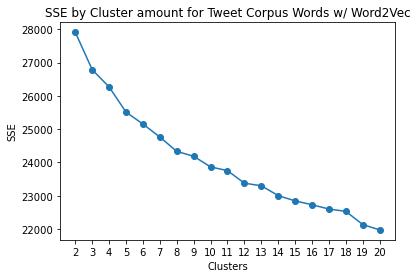

In [20]:
elbow_method(df_tokens, 20, "Tweet Corpus Words w/ Word2Vec")

**Elbow method doesn't yield an optimal result. That means that the data doesn't provide a good basis for clustering.**

Testing out 8 Clusters:

In [21]:
df_y = model_kmeans(df_tokens, 8)

Running dimensionality reduction:

In [22]:
df_tsne= model_tsne(df_tokens)

Visualize Word2Vec results:

In [24]:
plot_2d(df_tsne, df_y, df_labels, "Vaccine Tweet Corpus")

In [104]:
df_model.wv.most_similar("delta") 

[('deltavariant', 0.8551622629165649),
 ('alpha', 0.8240982890129089),
 ('beta', 0.8078728914260864),
 ('variant', 0.7851065397262573),
 ('alphavariant', 0.7486754655838013),
 ('deltaplus', 0.7332627773284912),
 ('effectively', 0.7277328372001648),
 ('neutralize', 0.7242665886878967),
 ('neutralises', 0.7229623198509216),
 ('neutralizes', 0.7069824934005737)]

In [113]:
df_model.wv.most_similar(positive=["deltavariant","pfizer"])

[('pfe', 0.6901930570602417),
 ('delta', 0.6649349927902222),
 ('deltaplusvariant', 0.649749219417572),
 ('alphavariant', 0.63584303855896),
 ('indianvariant', 0.6333106756210327),
 ('pzifer', 0.6326346397399902),
 ('goodnews', 0.6322039365768433),
 ('novovax', 0.6277657151222229),
 ('deltaplus', 0.6171257495880127),
 ('jnj', 0.609857976436615)]

- conspiracy theories revovle around billgates:
 - greatreset
 - merck
 - drfauci
 - operationwarpspeed

In [129]:
df_model.wv.most_similar("billgates")

[('greatreset', 0.8391050100326538),
 ('antivaxxers', 0.788785457611084),
 ('plandemic', 0.7772444486618042),
 ('genocide', 0.7771417498588562),
 ('drfauci', 0.7273931503295898),
 ('operationwarpspeed', 0.7085543870925903),
 ('pzifer', 0.6901214718818665),
 ('truth', 0.6772518157958984),
 ('criminal', 0.6760348081588745),
 ('merck', 0.6746935844421387)]

In [134]:
df_model.wv.most_similar(negative=["drfauci","bad"])

[('rajiv', 0.04546182602643967),
 ('ensuring', 0.040354445576667786),
 ('gmp', 0.028121918439865112),
 ('municipal', 0.0047166794538497925),
 ('capacity', 0.003442171961069107),
 ('registration', -0.0031637251377105713),
 ('pune', -0.006529860198497772),
 ('respective', -0.0067176297307014465),
 ('gandhi', -0.007431307807564735),
 ('consignment', -0.007553186267614365)]

---

In [28]:
from sklearn.feature_extraction.text import TfidfVectorizer

# TF-IDF

Term frequency - inverse document frequency:
- yields to preserve high information value within a text
- That means:
    - Words that appear in many tweets are likely irrelevant (think stopwords or "vaccine")
    - Words that appear only in a few are also likely to be irrelevant (think names/misspellings)

In [29]:
def tfidf_model(corpus, data):
    
    tfidf = TfidfVectorizer(min_df = 5, max_df = 0.95, max_features = 10000, stop_words = 'english').fit(corpus)
    text_matrix = tfidf.transform(corpus)
    
    labels = data.index.tolist()
    
    return tfidf, text_matrix, labels

In [30]:
tfidf_model_fitted, df_data, df_labels = tfidf_model(df["corpus"][:1000], df[:1000])

Elbow method:

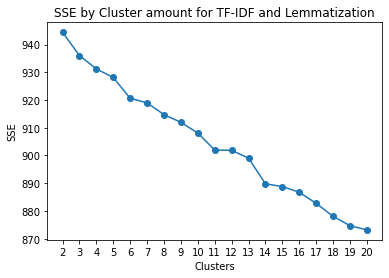

In [31]:
elbow_method(df_data, 20, "TF-IDF and Lemmatization")

The elbow method yielded poor results for the sample size.

Clustering with 9 clusters:

In [32]:
df_y = model_kmeans(df_data, 9)

Keyword extraction:

In [33]:
print("TF-IDF keywords: ")
cluster_keywords_tfidf(tfidf_model_fitted, df_data, df_y, 9)

TF-IDF keywords: 
Cluster 0: best, approved, ksa, russian, safe, vaccine, russia, effective, sputnikv
Cluster 1: dose, covidvaccine, amazing, covid, great, grateful, today, vaccine, pfizerbiontech
Cluster 2: nd, happy, today, dose, fully, got, moderna, vaccinated, thanks
Cluster 3: feeling, today, great, second, dose, vaccine, shot, thank, moderna
Cluster 4: pm, world, proud, support, great, covid, vaccine, covaxin, india
Cluster 5: dose, hope, vaccinated, covid, vaccination, vaccine, sinopharm, china, sinovac
Cluster 6: vaccination, thank, centre, staff, volunteer, friendly, efficient, oxfordastrazeneca, super
Cluster 7: variant, ji, covid, approval, good, best, safe, vaccine, covaxin
Cluster 8: happy, best, free, friend, love, pfizer, covid, vaccine, moderna


Dimensionality reduction:

In [34]:
tfidf_tsne = model_tsne(df_data.todense())

Plot:

In [35]:
plot_2d(tfidf_tsne, df_y, df_labels, "TF-IDF and Lemmatization")

Note: Elbow method doesn't show a perfect elbow, that means that kmeans wasn't able to detect good enough clusters.

___

# Doc2Vec

Doc2Vec works similarily to Word2Vec, only difference is that it takes in whole documents/text instead of single words. It creates a document vector which can be used to identify similar documents. This could be useful to identify similar tweets.

In [36]:
from gensim.models.doc2vec import Doc2Vec, TaggedDocument
from nltk.tokenize import word_tokenize
from scipy import sparse

In [37]:
def doc2vec_model(tagged_data, max_epochs, data):

    model = Doc2Vec(vector_size=100, min_count=35, workers = 6, dm = 1)#The Algorithms here are called "distributed memory" and "distributed bag of words"

    model.build_vocab(tagged_data)

#    for epoch in range(max_epochs):
    model.train(tagged_data, total_examples=model.corpus_count, epochs=max_epochs)
    model.alpha -= 0.0002
    model.min_alpha = model.alpha

    tokens = [model.docvecs[i] for i in range(len(model.docvecs))]
    labels = [data.index[i] for i in range(len(model.docvecs))]
    
    
    #model.save("../models/doc2vec")
    return model, tokens, labels

In [38]:
doc2vec_model, df_tokens, df_labels = doc2vec_model(data_tagging(df[:1000], df["corpus"][:1000]), 30, df)

Elbow method:

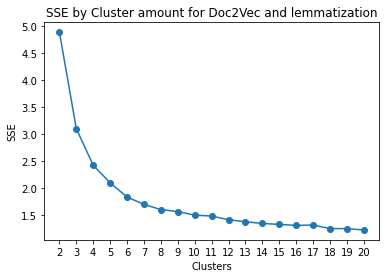

In [39]:
elbow_method(df_tokens, 20, "Doc2Vec and lemmatization")

The elbow method looks ideal. The suggested cluster should be around 6.

Clustering with 7 clusters:

In [40]:
doc2vec_y = model_kmeans(df_tokens, 7)

Keywords by cluster:

In [41]:
print("Keywords (averaged): ")
cluster_keywords_average(doc2vec_model, df_tokens, doc2vec_y, data_tagging(df[:1000], df["corpus"][:1000]))

Keywords (averaged): 
Cluster 0:  [('year', 2), ('mysuru', 1), ('fine', 1), ('appreciation', 1), ('neighbour', 1)]
Cluster 1:  [('year', 2), ('mysuru', 1), ('fine', 1), ('appreciation', 1), ('neighbour', 1)]
Cluster 2:  [('covid', 1), ('great', 1), ('india', 1), ('aiims', 1), ('foundation', 1)]
Cluster 3:  [('vaccinated', 2), ('free', 2), ('virtual', 1), ('thanks', 1), ('sinovac', 1)]
Cluster 4:  [('friendly', 1), ('lovescience', 1), ('centre', 1), ('today', 1), ('guy', 1)]
Cluster 5:  [('vaccinated', 2), ('free', 2), ('virtual', 1), ('thanks', 1), ('sinovac', 1)]
Cluster 6:  [('thanks', 2), ('coffee', 1), ('moderna', 1), ('today', 1), ('giving', 1)]


In [42]:
print("Keywords for lemmatized corpus: ")
cluster_keywords_total(data_tagging(df[:100], df.corpus[:100]), doc2vec_y)

Keywords for lemmatized corpus: 
Cluster 0: vaccine, great, moderna, people, dose, grateful
Cluster 1: vaccine, covid, thank, moderna, get, today
Cluster 2: vaccine, great, moderna, thank, dose, covid
Cluster 3: vaccine, covaxin, award, valley, congratulation, excellence
Cluster 4: effective, friend, vaccine, got, proud, moderna
Cluster 5: moderna, get, super, covaxin, like, beautiful
Cluster 6: vaccine, thank, effective, safe, moderna, best


Dimensionality Reduction:

In [43]:
doc2vec_tsne = model_tsne(df_tokens)

Results of sample size in Doc2Vec:

In [44]:
plot_2d(doc2vec_tsne, doc2vec_y, df_labels, "Doc2Vec and lemmatization")

In [45]:
doc2vec_model.docvecs.most_similar("12")

[('32', 0.9938327074050903),
 ('854', 0.9927536845207214),
 ('764', 0.9926590323448181),
 ('553', 0.992587685585022),
 ('428', 0.992365300655365),
 ('223', 0.9923017024993896),
 ('65', 0.9922378063201904),
 ('430', 0.9922188520431519),
 ('791', 0.9921087026596069),
 ('304', 0.9920868277549744)]

___

We ran both Doc2Vec with tf-idf in a python script and exportet the results. The models are under ```./models/```

# Doc2Vec (pre-computed)

Import model:

In [46]:
doc2vec_model = Doc2Vec.load("../models/Doc2Vec_model/doc2vec")
df_tokens = [doc2vec_model.docvecs[i] for i in range(len(doc2vec_model.docvecs))]
df_labels = [df.index[i] for i in range(len(doc2vec_model.docvecs))]
doc2vec_tsne = np.load("../models/Doc2Vec_model/doc2vec_tsne.npy")

Elbow method:

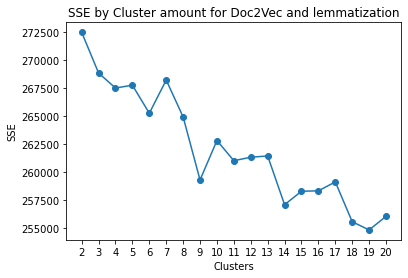

In [47]:
elbow_method(df_tokens, 20, "Doc2Vec and lemmatization")

The results are rather suboptimal. That likely means that the data doesn't yield good clusters.

Clustering with 9 clusters:

In [48]:
doc2vec_y = model_kmeans(df_tokens, 9)

In [49]:
df = df.dropna(subset=["corpus"]).reset_index(drop=True)
df = df.dropna(subset=["user_location"]).reset_index(drop=True)

Keywords by cluster:

In [50]:
print("Keywords (averaged): ")

cluster_keywords_average(doc2vec_model, df_tokens, doc2vec_y, data_tagging(df[:], df["corpus"][:]))

Keywords (averaged): 
Cluster 0:  [('vaccine', 2), ('govt', 1), ('country', 1), ('central', 1), ('etc', 1)]
Cluster 1:  [('took', 1), ('covaxin', 1)]
Cluster 2:  [('vaccinated', 1), ('fully', 1), ('moderna', 1)]
Cluster 3:  [('vaccine', 2), ('pandemic', 1), ('vaccineequity', 1), ('astrazeneca', 1), ('moderna', 1)]
Cluster 4:  [('r', 3), ('dose', 3), ('govt', 1), ('central', 1), ('center', 1)]
Cluster 5:  [('largestvaccinedrive', 1), ('largestvaccinationdrive', 1), ('fastest', 1), ('country', 1), ('india', 1)]
Cluster 6:  [('dose', 2), ('covid', 2), ('card', 1), ('ab', 1), ('moderna', 1)]
Cluster 7:  [('minuscule', 1), ('reported', 1), ('covid', 1), ('india', 1), ('case', 1)]
Cluster 8:  [('given', 1), ('country', 1), ('survive', 1), ('covidsecondwave', 1), ('tax', 1)]


Visualize results:

In [52]:
plot_2d(doc2vec_tsne, doc2vec_y, df_labels, "Doc2Vec and lemmatization")

In [169]:
df.full_text[30000]

'@alxyeee @TorontoPolice @RebelNewsOnline Who is eating alone today because Doug Ford and Trudeau Toronto Ontario Canada forced you to stay home #lockdown no family, no business, no church, no hope, no life #MentalHealth Order Russia #SputnikV Get out of Syria #COVID19 #spring #healthcare https://t.co/DSH0zCyIta https://t.co/ZNTrJV1lbW'

In [171]:
new_vector = doc2vec_model.infer_vector(["30000"])
sims = doc2vec_model.docvecs.most_similar([new_vector]) 

In [172]:
sims

[('24458', 0.3502393364906311),
 ('26512', 0.335532009601593),
 ('20755', 0.33147919178009033),
 ('7364', 0.33073991537094116),
 ('22941', 0.3179384469985962),
 ('23033', 0.31552407145500183),
 ('28853', 0.30344778299331665),
 ('26161', 0.2979808449745178),
 ('23224', 0.2979445457458496),
 ('22447', 0.2943466603755951)]

In [173]:
df.full_text[24458]

'We t to couple of centres during this past week. One day the centre would ask to come early for offline tokens. The other day they donâ\x80\x99t issue tokens saying online slots are full. Everyday itâ\x80\x99s a hustle for vaccine without any result. #helpforvaccine #COVAXIN'

**these tweets have a similarity of 35%, which explains why they don't seem to be related at all.**

___
# tf-idf (pre-computed)

Import model:

In [55]:
import pickle

In [56]:
tfidf_model_fitted = pickle.load(open('../models/tf-idf_model/tfidf_model.pickle','rb'))
tfidf_matrix = pickle.load(open('../models/tf-idf_model/tfidf_matrix.pickle', 'rb'))
tfidf_labels = pickle.load(open('../models/tf-idf_model/tfidf_labels.pickle','rb'))
tfidf_tsne = np.load('../models/tf-idf_model/tfidf_tsne.npy')

Elbow method:

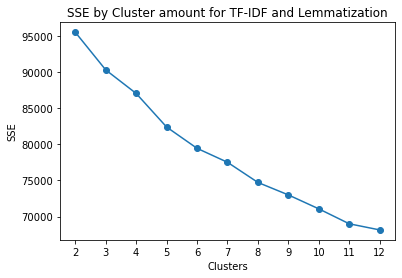

In [57]:
elbow_method(tfidf_matrix, 12, "TF-IDF and Lemmatization")

Elbow method doesn't yield definit results which leads to the assumption that the datasat might not offer good clusters.

Clustering with 8 clusters:

In [58]:
df_y = model_kmeans(tfidf_matrix, 8)

Extracting keywords for each cluster:

In [59]:
print("TF-IDF keywords: ")
cluster_keywords_tfidf(tfidf_model_fitted, tfidf_matrix, df_y, 9)

TF-IDF keywords: 
Cluster 0: dos, use, vaccination, sputnikv, covishield, vaccine, covid, covaxin, india
Cluster 1: trial, vaccinated, hospital, vaccination, covishield, covid, vaccine, dose, covaxin
Cluster 2: today, second, vaccinated, dose, got, shot, covid, vaccine, moderna
Cluster 3: vaccinated, coronavirus, vaccination, covidvaccine, astrazeneca, covid, vaccine, moderna, pfizer
Cluster 4: coronavirus, country, case, canada, sputnik, covid, vaccine, russia, sputnikv
Cluster 5: astrazeneca, pfizer, vaccination, dose, covidvaccine, covid, vaccine, oxfordastrazeneca, pfizerbiontech
Cluster 6: vaccination, dose, vaccinated, dos, covid, china, vaccine, sinopharm, sinovac
Cluster 7: india, vaccination, health, dose, hospital, covaxin, age, bbmp, slot


Visualizing results:

In [60]:
plot_2d(tfidf_tsne, df_y, tfidf_labels, "TF-IDF and Lemmatization")

TF-IDF yields a better visualization than doc2vec. However it isn't perfect yet. To further explore the text of the dataset, we suggest to try out different hyper paramters for tuning the vectorization and dimensionality reduction